# Анализ рыка заведений общественного питания в Москве

Исследуем рынок заведений общественного питания в Москве. Для анализа испоьзуем датасет, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. *Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.*

**Цель исследования - выявить закономерности и особенности рынка, которые позволят заказчику определиться с форматом заведения: кафе, ресторан, пиццерия, паб или бар, асположением, меню и ценами.**

*Выводы представить в форме информативной и лаконичной презентации.* 

**Описание данных**

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: *«Средний счёт: 1000–1500 ₽»; «Цена чашки капучино: 130–220 ₽»; «Цена бокала пива: 400–600 ₽». и так далее;*
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: *Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.*
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: *Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений. Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число. Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.*
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки): *0 — заведение не является сетевым; 1 — заведение является сетевым*
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.


###  Загрузка данных и получение общей информации о датасете

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium import Choropleth

import plotly.express as px

In [2]:
pip install plotly --upgrade #text_auto не работала из-за старой версии plotly

Note: you may need to restart the kernel to use updated packages.


In [3]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


- в датасете содержатся данные о 8406 заведениях c 14 параметрамм (столбцамм)
- пропуски встречаются в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Обработкой пропусков займемся на следующем шаге   
- типы значений у солбцов соответствуют хранимым в них значениям, приводить к другим типам значения не требуется

### Предобработка данных
#### Обработка дубликатов  в данных. 

In [5]:
data.duplicated().sum()

0

Явных дубликатов в данных нет

In [6]:
print('Кол-во уникальных значений в колонке name:', data.name.nunique(),'\n', 'Кол-во уникальных значений в колонке name после приведения значений к нижнему регистру:', data.name.str.lower().nunique())

Кол-во уникальных значений в колонке name: 5614 
 Кол-во уникальных значений в колонке name после приведения значений к нижнему регистру: 5512


In [7]:
# приведем к нижнему регистру значения в колонке name
data.name = data.name.str.lower()

In [8]:
# проверим датасет на неявные дубликаты по сочетанию столбцов name + address 
print('Кол-во неявных дубликтов по сочетанию столбцов name + address :' , data.duplicated(subset = ['name', 'address']).sum())
data_duplicates = data[data.duplicated(subset = ['name', 'address'])]
data_duplicates

Кол-во неявных дубликтов по сочетанию столбцов name + address : 3


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [9]:
# посмотрим, чем отличаются дублирующие строки между собой и примем решение, какую оставить
for index, row in data_duplicates.iterrows():
    display(data.query('name == @row["name"] and address == @row["address"]'))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


- для ресторана "more poke" строки отличаются режимом работы и флагом chain
- у ресторанов "раковарня клешни и хвосты" и "хлеб да выпечка" строки отличаются координатами и флагом chain

Оставим те строки из дублирующихся, у которых правильно проставлен флаг chain - для этого проверим, есть ли еще заведения с таким названием в датасете

In [10]:
display("more poke", data.query('name == "more poke"').name.shape[0])
display("раковарня клешни и хвосты", data.query('name == "раковарня клешни и хвосты"').name.shape[0])
display("хлеб да выпечка", data.query('name == "хлеб да выпечка"').name.shape[0])

'more poke'

3

'раковарня клешни и хвосты'

3

'хлеб да выпечка'

3

In [11]:
# удалим записи, у которых неправильно проставлен флаг - все проверенные заведения являются сетевыми
data.drop([1430, 2211, 3109], inplace = True)

#### Выявление аномалий в датасете

In [12]:
(
    data
    .describe(percentiles=[.01, .25, .5, .75, .99])
    .style.format({'rating' : '{:.1f}', 'middle_avg_bill': '{:.2f}','middle_coffee_cup': '{:.2f}',\
                   'chain': '{:.0f}','seats': '{:.0f}'})
)

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8403.000000,8403.000000,8403.0,3149.00,535.00,8403,4792
mean,55.750096,37.608604,4.2,958.05,174.72,0,108
std,0.069664,0.098583,0.5,1009.73,88.95,0,123
min,55.573942,37.355651,1.0,0.00,60.00,0,0
1%,55.594550,37.404064,2.3,140.00,60.00,0,0
25%,55.705018,37.538637,4.1,375.00,124.50,0,40
50%,55.753407,37.605260,4.3,750.00,169.00,0,75
75%,55.795028,37.664810,4.4,1250.00,225.00,1,140
99%,55.895399,37.839275,5.0,3750.00,309.90,1,625
max,55.928943,37.874466,5.0,35000.00,1568.00,1,1288


В данных присутствуют аномальные значения:
- в столбце middle_avg_bill	максимальный средний счет в размере 35000 при значении 99%-ного перцентиля - 3750. Также минимальное значение среднего счета - 0 - явно аномальное значение
- в столбце middle_coffee_cup максимальная средняя цена за чашку капучино в размере 1568, когда 99% всех средних цен не превышают значение 309 руб - явно выброс
- в столбце seats 1% всех данных имеет значение кол-ва посадочных мест больше 625 (что довольно много) - необходимо отдельно посмотреть.

Ниже посмотрим на выбросы подробнее и примем решение, что с ними делать.


##### Обработка аномалий в столбце middle_avg_bill

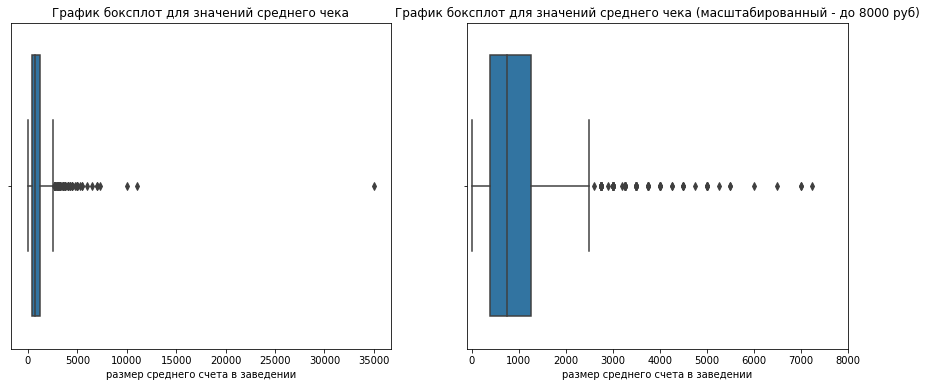

In [13]:
fig,ax = plt.subplots(1,2, figsize = (15,6))

ax[0] = sns.boxplot(data = data, x = 'middle_avg_bill', ax = ax[0])
ax[0].set_title('График боксплот для значений среднего чека')
ax[0].set_xlabel('размер среднего счета в заведении');\

ax[1] = sns.boxplot(data = data, x = 'middle_avg_bill', ax = ax[1])
ax[1].set_xlim([-100, 8000])
ax[1].set_title('График боксплот для значений среднего чека (масштабированный - до 8000 руб)')
ax[1].set_xlabel('размер среднего счета в заведении');

In [14]:
x = data.middle_avg_bill.quantile(0.01)
y = round(data.middle_avg_bill.quantile(0.999),0)
print( f'Кол-во аномальных значений (меньше {x} или больше {y}) в столбце middle_avg_bill :  \
{data.query("middle_avg_bill < @x or middle_avg_bill> @y").name.count()}')

Кол-во аномальных значений (меньше 140.0 или больше 7213.0) в столбце middle_avg_bill :  34


Чтобы аномальные значения в столбце middle_avg_bill не исказили результаты анализа цен в заведениях, ***заменим их на nan***. Не удаляем эти строки, чтобы не потерять данные о заведении для анализа расположения, рейтингов, кол-ва мест.

In [15]:
display('КОл-во строк в датасете ДО замены аномальных значений в middle_avg_bill на nan', data.middle_avg_bill.isna().sum())
data.loc[((data.middle_avg_bill <x ) | (data.middle_avg_bill > y )), 'middle_avg_bill'] = np.nan
display('КОл-во строк в датасете ПОСЛЕ замены аномальных значений в middle_avg_bill на nan', data.middle_avg_bill.isna().sum())

'КОл-во строк в датасете ДО замены аномальных значений в middle_avg_bill на nan'

5254

'КОл-во строк в датасете ПОСЛЕ замены аномальных значений в middle_avg_bill на nan'

5288

##### Обработка аномалий в столбце middle_coffee_cup

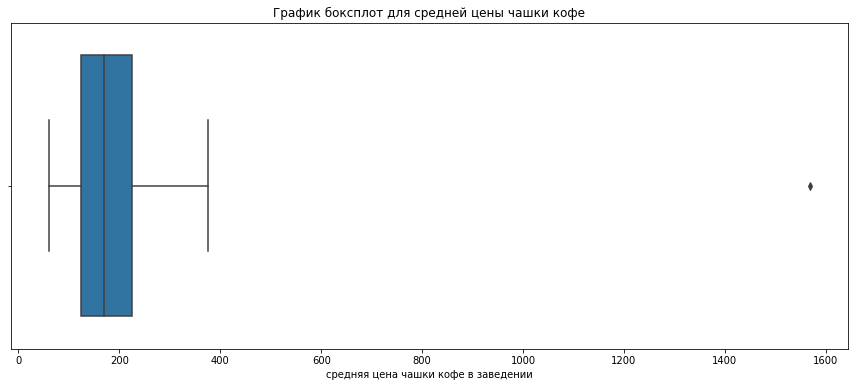

In [16]:
fig,ax = plt.subplots(figsize = (15,6))
ax = sns.boxplot(data = data, x = 'middle_coffee_cup')
ax.set_title('График боксплот для средней цены чашки кофе')
ax.set_xlabel('средняя цена чашки кофе в заведении');

Заменим максимальное значение средней цены чашки кофе на nan .

In [17]:
display('КОл-во строк в датасете ДО замены аномальных значений в middle_coffee_cup на nan', data.middle_coffee_cup.isna().sum())
data.loc[(data.middle_coffee_cup == data.middle_coffee_cup.max()), 'middle_coffee_cup'] = np.nan
display('КОл-во строк в датасете ПОСЛЕ замены аномальных значений в middle_coffee_cup на nan', data.middle_coffee_cup.isna().sum())

'КОл-во строк в датасете ДО замены аномальных значений в middle_coffee_cup на nan'

7868

'КОл-во строк в датасете ПОСЛЕ замены аномальных значений в middle_coffee_cup на nan'

7869

##### Обработка аномалий в столбце seats

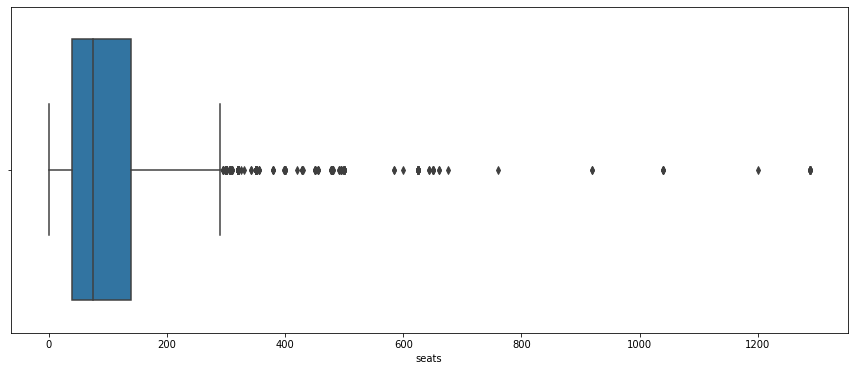

In [18]:
fig,ax = plt.subplots(figsize = (15,6))
ax = sns.boxplot(data = data, x = 'seats')

In [19]:
x = round(data.seats.quantile(0.01),0)
y = round(data.seats.quantile(0.99),0)
print( f'Кол-во аномальных значений (меньше  или равно{x}) в столбце seats :  \
{data.query("seats<=@x").name.count()}')
print( f'Кол-во аномальных значений (больше {y}) в столбце seats :  \
{data.query("seats> @y ").name.count()}')

Кол-во аномальных значений (меньше  или равно0.0) в столбце seats :  136
Кол-во аномальных значений (больше 625.0) в столбце seats :  30


Посмотрим внимательнее на левый хвост распределения, а именно заведения, у которых указанное кол-во мест - 0. Кажется, что для заведений формата булочной, кофейни, пиццерия - это допустимо, т.к. заведения могут работать на вынос, но для ресторанов и кафе - это вероятно, ошибка в данных. Так что посмотрим, на эти заведения в разрезе категорий.

In [20]:
data.query("seats<= @x").groupby('category').name.count().sort_values(ascending = False)

category
кафе               44
кофейня            24
ресторан           20
быстрое питание    18
булочная           11
пиццерия           10
столовая            5
бар,паб             4
Name: name, dtype: int64

Не будем удалять строки с нулевыми значениями в колонке seats, где они кажутся ошибочными (а именно: для кафе, ресторанов, столовых), чтобы не потерять данные для анализа цен и рейтингов в заведениях. Но чтобы не забыть исключить эти записи в анализе по кол-ву мест - изменим аномальное значение на nan.

In [21]:
print('Кол-во пропусков в seats ДО замены аномальных значений на nan', data.seats.isna().sum())
data.loc[(data.seats <= x) & (data.category.isin(['кафе', 'ресторан', 'столовая'])), 'seats'] = np.nan
print('Кол-во пропусков в seats после замены аномальных значений на nan', data.seats.isna().sum())

Кол-во пропусков в seats ДО замены аномальных значений на nan 3611
Кол-во пропусков в seats после замены аномальных значений на nan 3680


Посмотрим внимательнее на правй хвост распределения

In [22]:
data.query("seats> @y").sort_values(by = 'seats')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6696,кабул,ресторан,"Москва, улица Миклухо-Маклая, 6",Юго-Западный административный округ,пн-пт 07:00–21:00; сб 07:00–18:00,55.652025,37.498719,4.3,NaN,NaN,NaN,NaN,1,644.0
6548,vibes cafe,кафе,"Москва, улица Миклухо-Маклая, 6",Юго-Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.651882,37.499295,4.4,NaN,NaN,NaN,NaN,0,644.0
5835,lyanson’s coffee,кафе,"Москва, Мичуринский проспект, 27, корп. 1",Западный административный округ,пн-пт 08:00–20:00,55.697630,37.501684,3.8,NaN,NaN,NaN,NaN,0,650.0
5841,for your kids,кафе,"Москва, Мичуринский проспект, 58, корп. 1",Западный административный округ,NaN,55.691382,37.486793,3.3,NaN,NaN,NaN,NaN,0,650.0
5758,шоколадница,кофейня,"Москва, Мичуринский проспект, 22, корп. 1",Западный административный округ,"ежедневно, 08:00–23:00",55.701211,37.503986,4.2,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,650.0
5738,университетское,кофейня,"Москва, Мичуринский проспект, 8, стр. 1",Западный административный округ,"ежедневно, 07:00–20:00",55.705561,37.511163,4.3,NaN,NaN,NaN,NaN,0,650.0
5720,ресторан китайской кухни чуаньюй,ресторан,"Москва, Мичуринский проспект, 7, корп. 1",Западный административный округ,"ежедневно, 11:00–23:00",55.700431,37.512799,4.4,средние,NaN,NaN,NaN,0,650.0
5655,the fox pub,"бар,паб","Москва, Мичуринский проспект, 22, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.701625,37.504137,4.7,NaN,NaN,NaN,NaN,0,650.0
2901,ресторан тройка,"бар,паб","Москва, Измайловское шоссе, 71, корп. 2Б",Восточный административный округ,"ежедневно, 11:00–23:00",55.789276,37.747832,3.7,NaN,NaN,NaN,NaN,0,660.0
2913,хаус бар,"бар,паб","Москва, Измайловское шоссе, 71, корп. 2Б",Восточный административный округ,"ежедневно, 07:00–23:00",55.789639,37.747274,3.7,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,660.0


- видно, что у примерно трети заведений из списка выше указано значение 1288 в колонке seats - похоже на какую-то ошибку. 
- Вообще, заведения на 600+ посадочных мест -  очень большие заведения даже для форматов кафе и ресторанов, а тем более для кофеен (они тоже есть в списке выше). 
- ***Не будем удалять строки с аномально большими значениями в колонке seats, чтобы не потерять данные для анализа цен и рейтингов в заведениях. Но чтобы не забыть исключить эти записи в анализе по кол-ву мест - изменим аномальное значение на nan.***

In [23]:
print('Кол-во пропусков в seats ДО замены аномальных значений на nan', data.seats.isna().sum())
data.loc[data.seats > y, 'seats'] = np.nan
print('Кол-во пропусков в seats ПОСЛЕ замены аномальных значений на nan', data.seats.isna().sum())

Кол-во пропусков в seats ДО замены аномальных значений на nan 3680
Кол-во пропусков в seats ПОСЛЕ замены аномальных значений на nan 3710


#### Обработка пропусков в данных. 

In [24]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5288
middle_coffee_cup    7869
chain                   0
seats                3710
dtype: int64

##### Обработка пропусков в столбце hours

Заменим пропуски в столбце на значение "неизвестно"

In [25]:
data.hours.fillna('неизвестно', inplace = True)
data.hours.isna().sum() # проверяем, что пропусков не осталось

0

##### Обработка пропусков в столбце price

In [26]:
print('Доля зааписей с пропусками в столбце price:',"{:.1f}%".format(data.price.isna().sum()/len(data)*100))

Доля зааписей с пропусками в столбце price: 60.5%


Больше 60% записей содержат пропуски в столбце price, постараемся часть пропусков заполнить значениями:
- предположим, что сетевые кафе имеют одинаковый уровень цен во всех заведениях сети
- восстановим значение price по значению middle_avg_bill, где это возможно (для заведений, у которых столбец middle_avg_bill заполнен)

Для оставшихся пропусков в price заменим price на значение 'неизвестно'.

###### Заполним значение price для сетевых заведений

In [27]:
#сетевые кафе
print ('Всего сетевых заведений с пропуском в price в нашем датасете:', data.query('chain == 1')['price'].isna().sum())

Всего сетевых заведений с пропуском в price в нашем датасете: 2068


In [28]:
names = data.query('price.isna() and chain == 1').name.unique() # названия сетевых заведений с пропусками в price
# проверим, сколько разных значений может быть в столбце price у заведений одной сети
data.query('name in @names').groupby('name')['price'].nunique().sort_values(ascending = False)

name
кофемания          3
крошка картошка    3
хинкальная         3
академия           3
osteria mario      3
                  ..
дастархан          0
дайнинг холл       0
да, еда            0
груша              0
индийская точка    0
Name: price, Length: 600, dtype: int64

Видно, что у разных заведений одной сети уровень цен может быть разным. Тогда заполним пропуски в price у сетевого заведения самым частым значением price у сети.

In [29]:
data.price.isna().sum()

5088

In [30]:
df = (
    data
    .query('name in @names')
    .dropna(subset=['price']) #исключаем пропуски в price
    .pivot_table(index = ['name', 'price'], values = 'address', aggfunc = 'count') #считаем, сколько заведений с определенным name и price
    .reset_index()
    .groupby('name').first() # группируем данные только по имени и выбираем первое значение в каждой группе - соответствует самому частому price
    .reset_index()[['name', 'price']] #оставляем только столбцы name и price
)
df # таблица с названием сети и самым частым значением price для заведений этой сети

,name,price
0,18 грамм,средние
1,7 сэндвичей,средние
2,abc coffee roasters,средние
3,air coffee,средние
4,arcus bar and food,средние
...,...,...
292,щепка,средние
293,эль кафе,низкие
294,южный дворик,средние
295,юрта,средние


In [31]:
data = data.merge(df, how = 'left', on = 'name',suffixes=('', '_df'))
data.loc[data.price.isna(), 'price'] = data.loc[data.price.isna(),'price_df']
data.drop(columns = ['price_df'], inplace = True)

In [32]:
print('Осталось пропусков в price после заполнения пропусков для сетевых заведений:', data.price.isna().sum())

Осталось пропусков в price после заполнения пропусков для сетевых заведений: 3963


###### Восстановим, где возможно, оставшиеся пропуски по значениям avg_bill (точнее по middle_avg_bill, middle_coffee_cup).


In [33]:
print( 'Кол-во заведений с пропусками в price и заполненными значениями в middle_avg_bill или middle_coffee_cup:', data.query('(~middle_avg_bill.isna() or ~middle_coffee_cup.isna()) and price.isna()').name.count())

Кол-во заведений с пропусками в price и заполненными значениями в middle_avg_bill или middle_coffee_cup: 382


In [34]:
# добавим столбец со значением среднего чека - одно из значений middle_avg_bill или middle_coffee_cup, либо NaN, если оба значения пустые
data['avg_bill_quant'] = data[['middle_avg_bill','middle_coffee_cup']].apply(np.nanmax, axis=1)

/opt/conda/lib/python3.9/site-packages/pandas/core/apply.py:290: RuntimeWarning: All-NaN axis encountered
  results[i] = self.f(v)


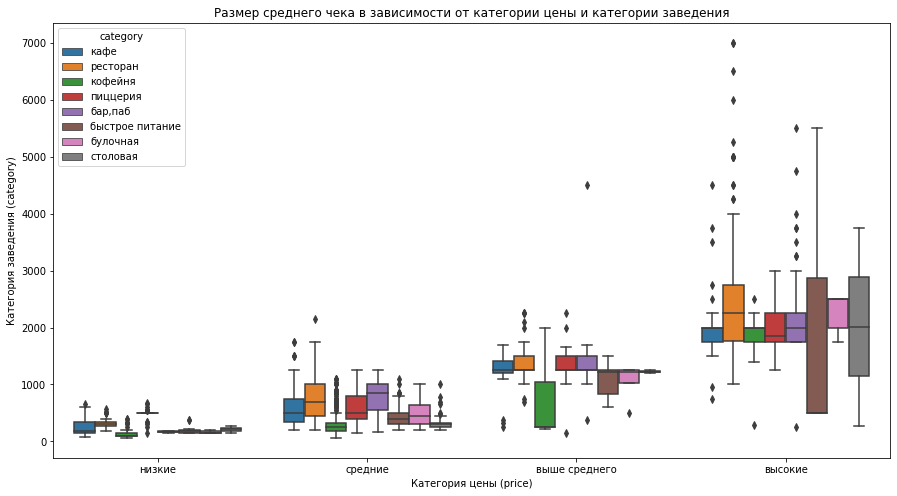

In [35]:
plt.figure(figsize=(15,8))
ax = sns.boxplot(data= data, y = 'avg_bill_quant', x = 'price', hue = 'category', order = ['низкие', 'средние', 'выше среднего', 'высокие'])
ax.set_title('Размер среднего чека в зависимости от категории цены и категории заведения')
ax.set_xlabel('Категория цены (price)')
ax.set_ylabel('Категория заведения (category)');

Из графика боксплот видно, что:
- критерий цены (значение в колонке price) зависит в основном от размера среднего чека , а от категории заведения зависит мало
- в категории "низкие" цены разброс значений вокруг медианного небольшой, самый большой разброс значений для заведений из категории "высокие цены"
- нет четкой границы между разными категориями цен - диапазоны средних чеков для разных ценовых категорий пересекаются

In [36]:
# данные с боксплот  в табличном виде
df = (
    data
    .pivot_table(index = ['category', 'price'], values = 'avg_bill_quant', aggfunc = ['min', 'max', 'median'])
    .droplevel(level = 1 , axis = 1)
    .reindex(['низкие', 'средние', 'выше среднего', 'высокие'], level = 1)
)
df

min     max  median
category        price                                
бар,паб         низкие          150.0   190.0   170.0
                средние         165.0  1250.0   850.0
                выше среднего   375.0  4500.0  1250.0
                высокие         250.0  5500.0  2000.0
булочная        низкие          150.0   200.0   150.0
                средние         200.0  1000.0   442.5
                выше среднего   500.0  1250.0  1225.0
                высокие        1750.0  2500.0  2500.0
быстрое питание низкие          140.0   375.0   180.0
                средние         200.0  1100.0   400.0
                выше среднего   600.0  1500.0  1225.0
                высокие         500.0  5500.0   500.0
кафе            низкие           75.0   650.0   187.5
                средние         200.0  1750.0   500.0
                выше среднего   250.0  1700.0  1250.0
                высокие         750.0  4500.0  2000.0
кофейня         низкие           60.0   400.0   100.0
                средние          60.0  1100.0   250.0
                выше среднего   214.0  2000.0   256.0
                высокие         290.0  2500.0  2000.0
пиццерия        низкие          150.0   675.0   500.0
                средние         150.0  1250.0   500.0
                выше среднего   150.0  2250.0  1250.0
                высокие        1250.0  3000.0  1850.0
ресторан        низкие          175.0   575.0   300.0
                средние         200.0  2150.0   700.0
                выше среднего   700.0  2250.0  1250.0
                высокие        1000.0  7000.0  2250.0
столовая        низкие          150.0   265.0   225.0
                средние         195.0  1000.0   300.0
                выше среднего  1200.0  1250.0  1225.0
                высокие         275.0  3750.0  2012.5

In [37]:
# определим функцию , которая принимает на вход pd.Series с индексами и значениями типа float и число target
def price_by_median(arr, target):
    # функция ищет среди значений из arr наиболее близкое к target
    nearest_to_target = min(arr.values, key=lambda x: abs(x-target))
    # функция возвращает индекс, соотретствующй найденному значению nearest_to_target
    return arr[arr == nearest_to_target].index[0][1]


# проходим циклом по всем значениям в датасете data 
for i in range(0, len(data)):
    # если в колонке price пропуск, а в добавленной колонке avg_bill_quant нет пропуска,
    # заполняем пропуск в price с помощью функции  price_by_median(),
    # т.е. находим ближайший к значению avg_bill_quant медианный размер среднего чека для заведений данной категории и соответствующий ему ценовой уровень price
    if pd.isna(data.loc[i, 'price']) and not pd.isna(data.loc[i, 'avg_bill_quant']):
        cat = data.loc[i, "category"]
        arr = df.query('category == @cat')['median']
        num = data.loc[i, 'avg_bill_quant']
        data.loc[i, 'price'] = price_by_median(arr, num)
    # иначе, продолжаем цикл    
    else:
        continue  


In [38]:
print( 'Кол-во заведений с пропусками в price и заполненными значениями в middle_avg_bill или middle_coffee_cup ПОСЛЕ применения функции:', data.query('(~middle_avg_bill.isna() or ~middle_coffee_cup.isna()) and price.isna()').name.count())

Кол-во заведений с пропусками в price и заполненными значениями в middle_avg_bill или middle_coffee_cup ПОСЛЕ применения функции: 0


In [39]:
print('Итого осталось пропусков в колонке price после заполнения, где возможно:', data.price.isna().sum())

Итого осталось пропусков в колонке price после заполнения, где возможно: 3581


##### Обработка пропусков в столбцах avg_bill, middle_avg_bill ,middle_coffee_cup


In [40]:
data[['avg_bill', 'middle_avg_bill' ,'middle_coffee_cup']].isna().sum()

avg_bill             4587
middle_avg_bill      5288
middle_coffee_cup    7869
dtype: int64

***Оставим пропуски как есть,*** поскольку значения среднего чека будут необходимы для дальнейшего анализа, а достаточно точно их восстановить не представляется возможным (если это делать по значениям price, то будут большие искажения, т.к. достаточно широкий диапазон среднего чека у каждого значения price).

##### Обработка пропусков в столбцах seats


***Оставим пропуски как есть,*** поскольку кол-ва посадочных мест будут необходимы для дальнейшего анализа, а достаточно точно их восстановить не представляется возможным.

#### Добавление столбцов
- столбец street с названиями улиц из столбца с адресом.
- столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): *True — если заведение работает ежедневно и круглосуточно; False — в противоположном случае.*
- столбец с сокращенным названием района (аббревиатурой)

In [41]:
data['street'] = data['address'].str.split(pat=", ", expand = True)[1]
data['street'].head(5)

0              улица Дыбенко
1              улица Дыбенко
2         Клязьминская улица
3    улица Маршала Федоренко
4        Правобережная улица
Name: street, dtype: object

In [42]:
data['is_24_7'] = False
data.loc[data['hours'].str.contains('ежедневно, круглосуточно', regex=False), 'is_24_7'] = True
print('Кол-во круглосуточных и некруглостоных заведений:','\n', data['is_24_7'].value_counts())

Кол-во круглосуточных и некруглостоных заведений: 
 False    7673
True      730
Name: is_24_7, dtype: int64


In [43]:
data['district_short'] = [''.join(y[0].capitalize() for y in x.replace('-', ' ').split()) for x in data['district']]
data[['district', 'district_short']].value_counts()

district                                 district_short
Центральный административный округ       ЦАО               2242
Северный административный округ          САО                899
Южный административный округ             ЮАО                892
Северо-Восточный административный округ  СВАО               890
Западный административный округ          ЗАО                850
Восточный административный округ         ВАО                798
Юго-Восточный административный округ     ЮВАО               714
Юго-Западный административный округ      ЮЗАО               709
Северо-Западный административный округ   СЗАО               409
dtype: int64

#### Выводы по разделу Предобработка данных

- Проверили, что в данных не было явных дубликатов
- Выявили аномальные значения в колонках middle_avg_bill, middle_coffee_cup, seats: в колонке меньше middle_avg_bill заменили 34 аномальных значения (меньше 140  - 1% перцентиль или больше 7200  - 99.9% перцентиль) на nan, в колонке middle_coffee_cup заменили одно значение с ценой за чашку кофе больше 1500 руб (при средней цене чашки кофе 300 руб) на nan, 30 значений с кол-вом мест больше 625 и 136 значений - с кол-вом мест 0 у заведений из категорий кафе, ресторан, столовая также заменили на nan. Было принято решение не удалять совсем записи с аномальными значениями, а заменять пропусками, чтобы сохранить данные в других столбцах для анализа.
- В данных было много пропусков: колонка hours - все пропуски заменены значением "неизвестно",колонка price - заполнили пропуски для сетевых кафе и по значениям среднего чека, где возможно, остальные оставили как есть - осталось 3994 пропусков из 5091; колонки avg_bill, middle_avg_bill, middle_coffee_cup, seats - оставили без изменений
- для удобства дальнейшего анализа добавили столбцы: street - с названием улицы из адреса заведения, is_24_7 - флаг круглосуточное заведение или нет, district_short - сокращенное название района

### Шаг 3. Анализ данных
#### Количество заведений по категориям 
Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

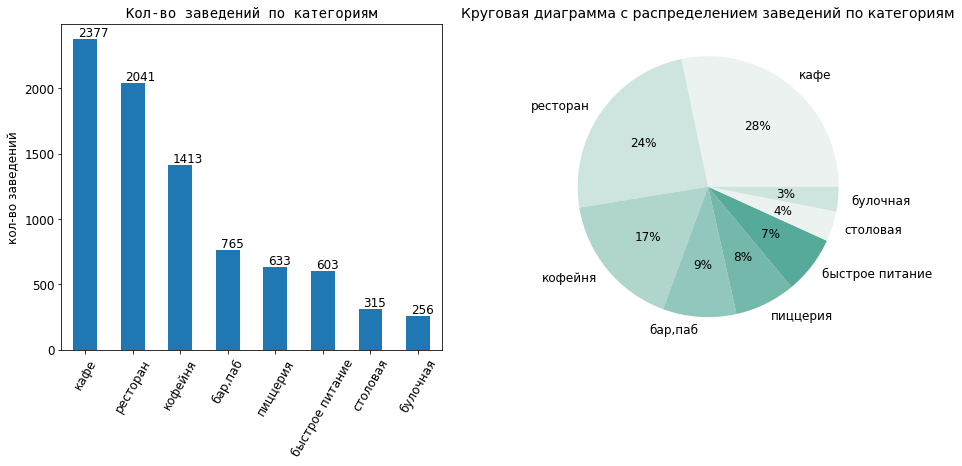

In [44]:
# Построение распределения заведений по категориям
fig, ax = plt.subplots(1,2, figsize = (15,6))

# график слева - столбчатая диаграмма с аннотациями
data.category.value_counts().plot(kind = 'bar', ax = ax[0],fontsize = 12)

ax[0].set_title('Кол-во заведений по категориям', fontname = 'monospace', fontsize = 14)
ax[0].set_ylabel ('кол-во заведений', fontsize = 12)
# Поворот подписей на 45
ax[0].set_xticklabels(labels = ax[0].get_xticklabels(), rotation=60)

# Добавление значений над столбцами
for index, value in enumerate(data.category.value_counts()):
    ax[0].text(index - 0.15, value + 20, str(value), fontsize = 12)  # Размещение значения чуть выше столбца

# график справа - круговая диаграмма
ax[1].pie(data.category.value_counts().values, labels=data.category.value_counts().index, autopct='%1.0f%%',\
          colors=sns.color_palette("light:#5A9"), textprops={'fontsize': 12})
ax[1].set_title('Круговая диаграмма с распределением заведений по категориям',fontsize = 14);


- Больше всего заведений из категории кафе (>2300), на втором месте - рестораны (2000)  и на третьем - кофейни (1400).
- В сумме кафе, рестораны и кофейни составляют 70% заведений в нашем датасете.
- Меньше всего заведений (7%) из категорий булочная (250) и столовая (300)

#### Количество посадочных мест в заведениях по категориям
Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [45]:
data.groupby('category')['seats'].agg(['mean', 'median']).sort_values(by = 'median', ascending = False).style.format('{:.0f}')

,mean,median
category,,
ресторан,119,90
"бар,паб",112,80
кофейня,105,80
столовая,96,78
быстрое питание,96,65
кафе,95,60
пиццерия,92,54
булочная,89,50


Видно, что несмотря на то, что исключили из анализа аномальные значения, значения среднего и медианы значительно отличаются, что свидетельствует о том, что распределения кол-ва мест асимметричны. ВИзуализируем распеределения.

In [46]:
data.groupby("category")["seats"].median().sort_values()[::-1]

category
ресторан           90.0
кофейня            80.0
бар,паб            80.0
столовая           78.0
быстрое питание    65.0
кафе               60.0
пиццерия           53.5
булочная           50.0
Name: seats, dtype: float64

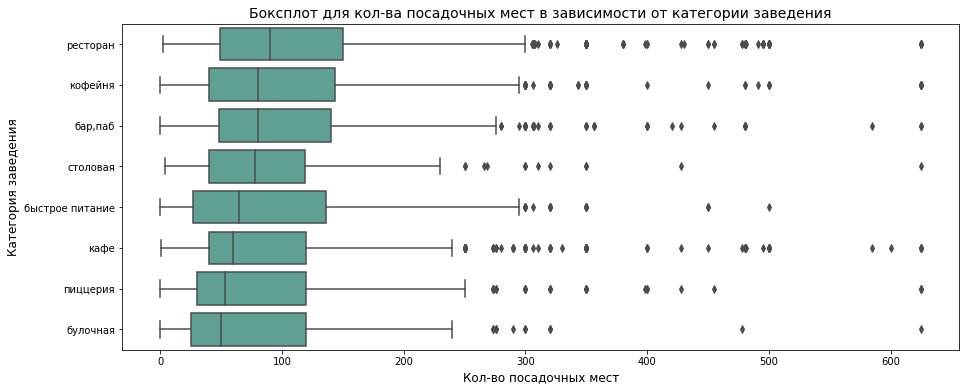

In [47]:
plt.subplots(figsize = (15,6))
medians_sorted = data.groupby("category")["seats"].median().sort_values()[::-1].index
sns.boxplot( data=data, x="seats", y="category", color="#5A9", order = medians_sorted)
plt.title('Боксплот для кол-ва посадочных мест в зависимости от категории заведения', fontsize = 14)
plt.xlabel('Кол-во посадочных мест', fontsize = 12)
plt.ylabel('Категория заведения', fontsize = 12);

- Видно, что для всех категорий заведений характерен широкий диапазон интерквартильного размаха и большое количество выбросов
- Медианные значения кол-ва мест у булочных, кафе, пиццерий и заведений быстрого питания - в диапазоне 50-65 мест
- У столовых, кофеен, баров и рестранов медианные значения кол-ва мест лежат в диапазоне 80-90

####  Соотношение сетевых и несетевых заведений 
Каких заведений больше?
Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

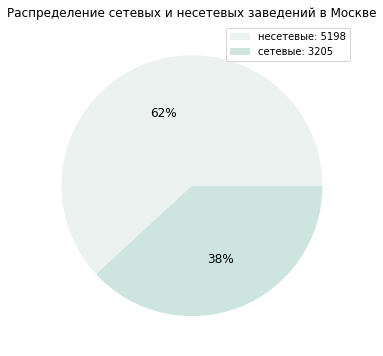

In [48]:
# визуализируем кол-во сетевых и несетвых заведений в Москве
plt.figure(figsize = (6,6))
plt.pie(data.chain.value_counts().values, autopct='%1.0f%%',\
          colors=sns.color_palette("light:#5A9"), textprops={'fontsize': 12});
plt.legend([f'несетевые: {data.chain.value_counts()[0]}', f'сетевые: {data.chain.value_counts()[1]}'])
plt.title("Распределение сетевых и несетевых заведений в Москве");

- 62% заведений в Москве - несетевые (5200), сетевых заведений - 38% (3200)

In [49]:
# посмотрим на распределение сетевых/несетевых кафе в разбивке по категориям заведений
df = (
    data
    .pivot_table(index = 'category', columns = 'chain', values = 'name', aggfunc = 'count', margins = True)
    .assign(ratio_0 =lambda d: d[0]/d['All']*100)
    .assign(ratio_1 =lambda d: d[1]/d['All']*100)
    .reset_index()
    #.droplevel('chain', axis = 1)
    .sort_values(by = 1)
    
 )
df.columns.name = None
df.style.format({'ratio_0': '{:.0f}%', 'ratio_1': '{:.0f}%'})

,category,0,1,All,ratio_0,ratio_1
7,столовая,227,88,315,72%,28%
1,булочная,99,157,256,39%,61%
0,"бар,паб",596,169,765,78%,22%
2,быстрое питание,371,232,603,62%,38%
5,пиццерия,303,330,633,48%,52%
4,кофейня,693,720,1413,49%,51%
6,ресторан,1311,730,2041,64%,36%
3,кафе,1598,779,2377,67%,33%
8,All,5198,3205,8403,62%,38%


- больше всего в абсолютном выражении сетевых заведений среди кафе, ресторанов и кофеен (779, 730 и 720, соответственно). 
- в относительном выражении (кол-во сетевых заведений к общему числу заведений в данной категории) лидеры - булочные, пиццерии и кофейни (61%, 52% и 51%, соответсвенно)
- баров и столовых - всего 22% и 28% сетевых
- среди заведений быстрого питания, ресторанов и кафе сетевыми являются около 30%-40% всех заведений 

Визуализируем результат ниже

In [50]:

fig = px.histogram(data,
             x='category',
             #y= 'count',
             color = 'chain',
             labels = {'category':'Категория заведения', 'count':'Количество заведений', 'chain':'сетевое заведение'},
             title = 'Соотношение сетевых/несетевых заведений у разных категорий',
             barmode='group',
             color_discrete_sequence=[
                 px.colors.qualitative.Set2[2],
                 px.colors.qualitative.Pastel2[2]],
             template="simple_white"
             ,text_auto = True
            )

fig.update_layout(legend_title_text='Сеть - 1/не сеть - 0')
fig.show()


In [51]:
for index, value in enumerate(df[df.category != 'All'].set_index('category').sort_values(by = 'ratio_1').ratio_0):
    print(index, value)

0 77.90849673202615
1 72.06349206349206
2 67.22759781236853
3 64.23321901028908
4 61.52570480928689
5 49.044585987261144
6 47.867298578199055
7 38.671875


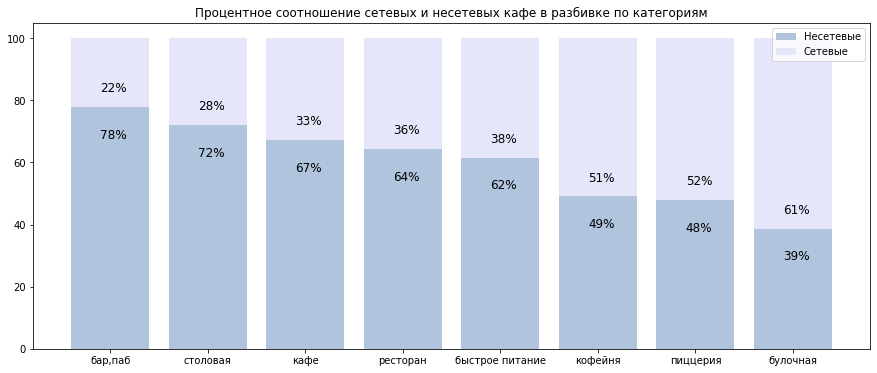

In [52]:
plt.figure(figsize = (15,6))
plt.bar(df[df.category != 'All'].sort_values(by = 'ratio_1').category, df[df.category != 'All'].sort_values(by = 'ratio_1').ratio_0, color='lightsteelblue')

#добавление аннотаций
for index, value in enumerate(df[df.category != 'All'].sort_values(by = 'ratio_1').ratio_0):
    plt.text( index - 0.1 , value - 10, str('{:,.0f}%'.format(value)), fontsize = 12)  # Размещение значения в столбце

plt.bar(df[df.category != 'All'].sort_values(by = 'ratio_1').category, df[df.category != 'All'].sort_values(by = 'ratio_1').ratio_1, bottom=df[df.category != 'All'].sort_values(by = 'ratio_1').ratio_0, color='lavender')

#добавление аннотаций
for index, value in enumerate(df[df.category != 'All'].sort_values(by = 'ratio_1').ratio_1):
    plt.text( index - 0.1 , 105 - value, str('{:,.0f}%'.format(value)), fontsize = 12)  # Размещение значения в столбце

plt.legend(['Несетевые', "Сетевые"])
plt.title("Процентное соотношение сетевых и несетевых кафе в разбивке по категориям")

plt.show()


#### Топ-15 популярных сетей в Москве. 
Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?
Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [53]:
top15_names = data.query('chain == 1').name.value_counts(ascending = False).head(15)
top15 = data[data.name.isin(top15_names.index.to_list())].sort_values(by = ['name','district'])
display(top15_names)


шоколадница                            120
домино'с пицца                          76
додо пицца                              74
one price coffee                        71
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
буханка                                 32
cofefest                                32
му-му                                   27
Name: name, dtype: int64

In [54]:
top15_cat = top15.groupby(['name', 'category']).agg(count = ('address', 'count')).reset_index().sort_values(by = ['name','count'], ascending = False)
top15_cat

,name,category,count
32,яндекс лавка,ресторан,69
31,шоколадница,кофейня,119
30,шоколадница,кафе,1
28,чайхана,кафе,26
29,чайхана,ресторан,9
27,чайхана,быстрое питание,2
24,хинкальная,кафе,19
25,хинкальная,ресторан,15
23,хинкальная,быстрое питание,6
22,хинкальная,"бар,паб",3


Оказывается, что разные заведения одной сети могут относиться к разным категориям. Устраним эту неоднозначность - заменим значение в столбце category самым часто встречающимся значением категории для данной сети.

In [55]:
top15_cat = top15_cat.groupby('name').category.first() #сделаем соответствие имя сетевого заведения - категория заведения однозначным (категория - это саоме часто встречющееся значение)
top15 = top15.merge(top15_cat, how = 'left', on = 'name', suffixes=('_old', '')).drop(columns = 'category_old') #заменим в таблице top15 значения категорий соответствующим образом (старые значения удалим)

Теперь визуализируем распределение топ-15 сетевых заведений по районам города. 

In [56]:
top15_by_districts = top15.pivot_table(index = [ 'category', 'name'], columns = 'district_short', values = 'address', aggfunc = 'count', margins = True).fillna(0)
top15_by_districts

district_short                                 ВАО   ЗАО   САО  СВАО  СЗАО  \
category name                                                                
булочная буханка                               2.0   7.0   9.0   8.0   3.0   
кафе     кулинарная лавка братьев караваевых   1.0   1.0   3.0   1.0   0.0   
         му-му                                 5.0   1.0   1.0   2.0   0.0   
         хинкальная                            7.0   4.0   1.0   1.0   3.0   
         чайхана                               2.0   6.0   3.0   5.0   2.0   
кофейня  cofefest                              4.0   3.0   4.0   4.0   1.0   
         cofix                                 6.0   4.0  10.0   6.0   4.0   
         one price coffee                      6.0   9.0   8.0   7.0   4.0   
         кофепорт                              1.0   7.0   4.0   7.0   4.0   
         шоколадница                          12.0  17.0  14.0  11.0   7.0   
пиццерия додо пицца                           11.0   6.0  10.0  10.0   6.0   
         домино'с пицца                       10.0   9.0  10.0   9.0   7.0   
ресторан prime                                 1.0   3.0   3.0   1.0   1.0   
         теремок                               1.0   2.0   4.0   6.0   2.0   
         яндекс лавка                         12.0   9.0   4.0   7.0   2.0   
All                                           81.0  88.0  88.0  85.0  46.0   

district_short                                  ЦАО   ЮАО  ЮВАО  ЮЗАО  All  
category name                                                               
булочная буханка                                1.0   0.0   0.0   2.0   32  
кафе     кулинарная лавка братьев караваевых   32.0   0.0   0.0   1.0   39  
         му-му                                 15.0   2.0   0.0   1.0   27  
         хинкальная                            14.0   3.0   5.0   6.0   44  
         чайхана                                3.0   3.0   9.0   4.0   37  
кофейня  cofefest                               5.0   3.0   3.0   5.0   32  
         cofix                                 20.0   9.0   4.0   2.0   65  
         one price coffee                      16.0   9.0   6.0   7.0   72  
         кофепорт                              15.0   1.0   0.0   3.0   42  
         шоколадница                           38.0  12.0   2.0   7.0  120  
пиццерия додо пицца                             5.0  12.0   6.0   8.0   74  
         домино'с пицца                         3.0  11.0  10.0   8.0   77  
ресторан prime                                 37.0   2.0   0.0   2.0   50  
         теремок                                7.0  10.0   3.0   3.0   38  
         яндекс лавка                           4.0  12.0   8.0  11.0   69  
All                                           215.0  89.0  56.0  70.0  818

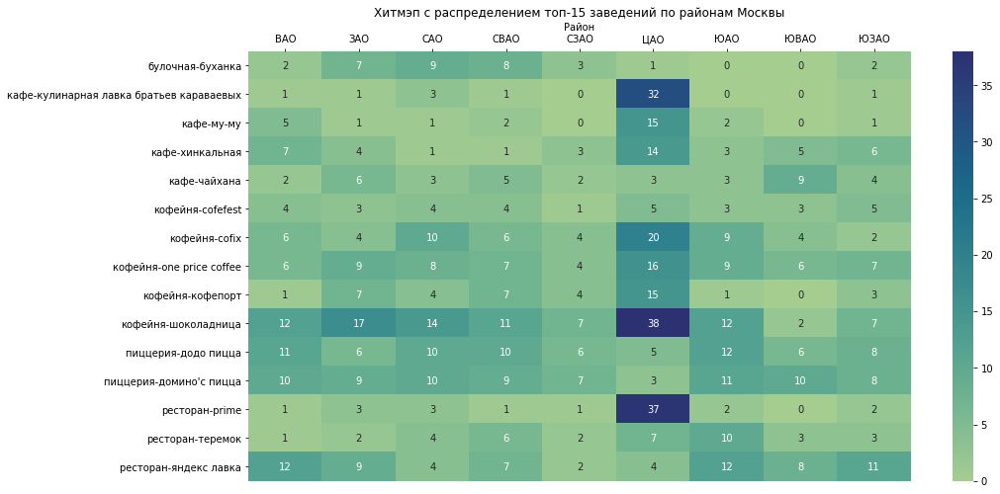

In [57]:
plt.figure(figsize=(15,8))
ax = sns.heatmap(top15_by_districts.iloc[:-1, :-1], cmap = 'crest', annot=True) #берем пивотную таблицу без итоговой колонки и итоговой строки
plt.title("Хитмэп с распределением топ-15 заведений по районам Москвы")
ax.set(xlabel="Район", ylabel="")
ax.xaxis.tick_top()
ax.xaxis.set_label_position("top");

- По графику хитмэп видно, что большинство заведений из топ-15 сетевых заведений Москвы (по кол-ву объектов в сети) расположены в ЦАО (214 из 816 заведений), при этом:
    - больше всего в ЦАО заведений сети Шоколадница (38), Prime (37) и кафе Братьев Караваевых (32)
    - пиццерии ДоДо  и Доминос Пицца, булочная Буханка, а также рестораны Яндекс Лавки мало представлены в ЦАО, в основном заведения сети расположены в других районах города    
- В ЮАО, САО, ЗАО, СВАО, ВАО примерно одинаковое кол-во заведений из топ-15 сетей - около 80-90
- меньше всего сетевые заведения из топ-15 представлены в СЗАО и ЮВАО и ЮЗАО (в основном, это заведения пиццерий ДоДо и Доминос, а также кафе сети Чайхана).

Посмотрим также, как внутри каждой сети распределены заведения по районам в относительном выражении (кол-во заведений сети в данном районе к общему кол-вк заведений сети)
 

In [58]:
# добавим столбцы с соотношениями кол-ва заведений в районе к общему кол-ву заведений в сети
for x in top15_by_districts.columns.values:    
    top15_by_districts[x+'_ratio'] = top15_by_districts[x]/top15_by_districts['All']
top15_by_districts    

district_short                                 ВАО   ЗАО   САО  СВАО  СЗАО  \
category name                                                                
булочная буханка                               2.0   7.0   9.0   8.0   3.0   
кафе     кулинарная лавка братьев караваевых   1.0   1.0   3.0   1.0   0.0   
         му-му                                 5.0   1.0   1.0   2.0   0.0   
         хинкальная                            7.0   4.0   1.0   1.0   3.0   
         чайхана                               2.0   6.0   3.0   5.0   2.0   
кофейня  cofefest                              4.0   3.0   4.0   4.0   1.0   
         cofix                                 6.0   4.0  10.0   6.0   4.0   
         one price coffee                      6.0   9.0   8.0   7.0   4.0   
         кофепорт                              1.0   7.0   4.0   7.0   4.0   
         шоколадница                          12.0  17.0  14.0  11.0   7.0   
пиццерия додо пицца                           11.0   6.0  10.0  10.0   6.0   
         домино'с пицца                       10.0   9.0  10.0   9.0   7.0   
ресторан prime                                 1.0   3.0   3.0   1.0   1.0   
         теремок                               1.0   2.0   4.0   6.0   2.0   
         яндекс лавка                         12.0   9.0   4.0   7.0   2.0   
All                                           81.0  88.0  88.0  85.0  46.0   

district_short                                  ЦАО   ЮАО  ЮВАО  ЮЗАО  All  \
category name                                                                
булочная буханка                                1.0   0.0   0.0   2.0   32   
кафе     кулинарная лавка братьев караваевых   32.0   0.0   0.0   1.0   39   
         му-му                                 15.0   2.0   0.0   1.0   27   
         хинкальная                            14.0   3.0   5.0   6.0   44   
         чайхана                                3.0   3.0   9.0   4.0   37   
кофейня  cofefest                               5.0   3.0   3.0   5.0   32   
         cofix                                 20.0   9.0   4.0   2.0   65   
         one price coffee                      16.0   9.0   6.0   7.0   72   
         кофепорт                              15.0   1.0   0.0   3.0   42   
         шоколадница                           38.0  12.0   2.0   7.0  120   
пиццерия додо пицца                             5.0  12.0   6.0   8.0   74   
         домино'с пицца                         3.0  11.0  10.0   8.0   77   
ресторан prime                                 37.0   2.0   0.0   2.0   50   
         теремок                                7.0  10.0   3.0   3.0   38   
         яндекс лавка                           4.0  12.0   8.0  11.0   69   
All                                           215.0  89.0  56.0  70.0  818   

district_short                                ВАО_ratio  ЗАО_ratio  САО_ratio  \
category name                                                                   
булочная буханка                               0.062500   0.218750   0.281250   
кафе     кулинарная лавка братьев караваевых   0.025641   0.025641   0.076923   
         му-му                                 0.185185   0.037037   0.037037   
         хинкальная                            0.159091   0.090909   0.022727   
         чайхана                               0.054054   0.162162   0.081081   
кофейня  cofefest                              0.125000   0.093750   0.125000   
         cofix                                 0.092308   0.061538   0.153846   
         one price coffee                      0.083333   0.125000   0.111111   
         кофепорт                              0.023810   0.166667   0.095238   
         шоколадница                           0.100000   0.141667   0.116667   
пиццерия додо пицца                            0.148649   0.081081   0.135135   
         домино'с пицца                        0.129870   0.116883   0.129870   
ресторан prime                                 0.020000 

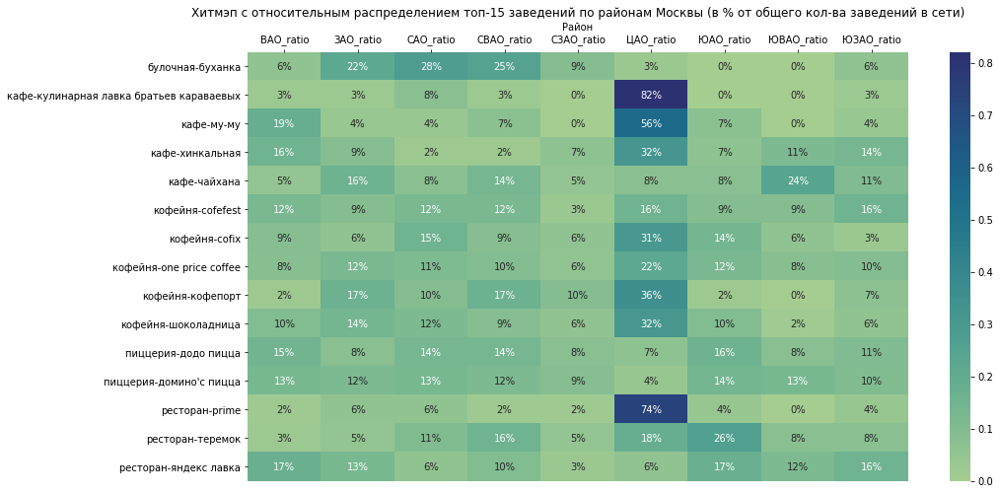

In [59]:
plt.figure(figsize=(15,8))
ax = sns.heatmap(top15_by_districts.iloc[:-1, 10:19], cmap = 'crest', annot=True, fmt=".0%")
plt.title("Хитмэп с относительным распределением топ-15 заведений по районам Москвы (в % от общего кол-ва заведений в сети)")
ax.set(xlabel="Район", ylabel="")
ax.xaxis.tick_top()
ax.xaxis.set_label_position("top");

Закономерности, которые видны из хитмэпа с распределением заведений по районам в процентах
- кафе сети Братьев Карававевых и рестораны Prime в основном располагаются в ЦАО и мало представлены (или совсем не представлены) в других районах Москвы. 
- Пестораны Яндекс Лавки и пиццерии ДоДо и Доминос, наоборот, мало представлены в центре. Вероятно, это связано с тем, что они в основном специализируются на доставке, а в ЦАО плотность населения ниже, чем в остальных районах города.
- кофейни (Cofix, OnePriceCoffee, Кофепорт, Шоколадница) имеют от 20 до 30% заведений в ЦАО, а в остальных районах Москвы распределены равномерно
- сеть булочных Буханка в основном представлена в ЗАО, САО и СВАО, и совсем отсутствует в ЮАО и ЮВАО
- остальные сети имеют более-менее равномерное покрытие по городу.

Построим похожую визуализацию для всех заведений сети, а не только для топ-15.

In [60]:
df = data.groupby('district_short').agg(count = ('name', 'count')).reset_index()
df

,district_short,count
0,ВАО,798
1,ЗАО,850
2,САО,899
3,СВАО,890
4,СЗАО,409
5,ЦАО,2242
6,ЮАО,892
7,ЮВАО,714
8,ЮЗАО,709


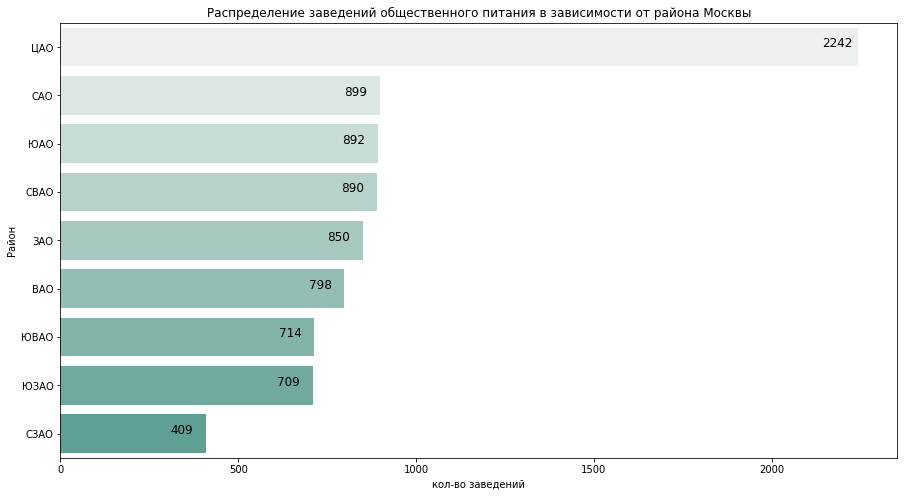

In [61]:
# распределение заведений по районам
df = data.groupby('district_short').agg(count = ('name', 'count')).sort_values(by = 'count', ascending = False).reset_index()
plt.figure(figsize=(15,8))
ax = sns.barplot(data = df, x="count", y="district_short", palette = ("light:#5A9"))
ax.set (xlabel = 'кол-во заведений', ylabel = 'Район', title = 'Распределение заведений общественного питания в зависимости от района Москвы')
# Добавление значений над столбцами
for index, value in enumerate(df.iloc[:,1]):
    ax.text(value - 100, index , str(value), fontsize = 12)  # Размещение значения в столбце


- Абсолютное большинство , почти четверть всех заведений, расположено в ЦАО (2242)
- Меньше всего заведений в СЗАО (всего 409), вероятно, потому, что в СЗАО бОльшая часть территории - это лесопарковая зона
- Во всех остальных районах Москвы примерно одинаковое кол-во заведений - от 700 до 900. 

In [62]:
# посмотрим на распределение по районам в разбивке по категориям
df = data.pivot_table(index = 'category', columns = 'district_short', values = 'name', aggfunc = 'count', margins = True)
df

district_short,ВАО,ЗАО,САО,СВАО,СЗАО,ЦАО,ЮАО,ЮВАО,ЮЗАО,All
category,,,,,,,,,,
"бар,паб",53,50,68,63,23,364,68,38,38,765
булочная,25,37,39,28,12,50,25,13,27,256
быстрое питание,71,62,58,82,30,87,85,67,61,603
кафе,272,238,235,269,115,464,264,282,238,2377
кофейня,105,150,193,159,62,428,131,89,96,1413
пиццерия,72,71,77,68,40,113,73,55,64,633
ресторан,160,218,188,181,109,670,202,145,168,2041
столовая,40,24,41,40,18,66,44,25,17,315
All,798,850,899,890,409,2242,892,714,709,8403


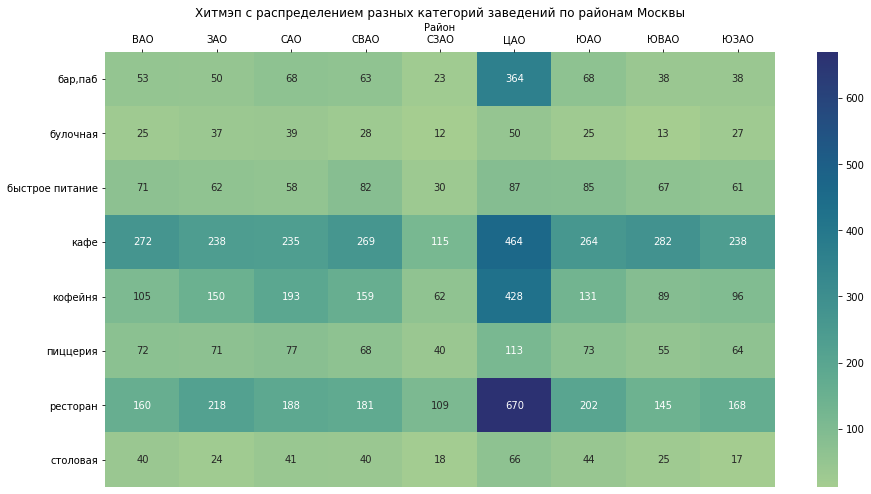

In [63]:
#визуализируем распределение
plt.figure(figsize=(15,8))
ax = sns.heatmap(df.iloc[:-1, :-1], cmap = 'crest', annot=True, fmt='.0f') #берем пивотную таблицу без итоговой колонки и итоговой строки
plt.title("Хитмэп с распределением разных категорий заведений по районам Москвы")
ax.set(xlabel="Район", ylabel="")
ax.xaxis.tick_top()
ax.xaxis.set_label_position("top");

In [64]:
data.groupby(['district_short', 'category']).agg(count = ('name','count')).reset_index()

,district_short,category,count
0,ВАО,"бар,паб",53
1,ВАО,булочная,25
2,ВАО,быстрое питание,71
3,ВАО,кафе,272
4,ВАО,кофейня,105
...,...,...,...
67,ЮЗАО,кафе,238
68,ЮЗАО,кофейня,96
69,ЮЗАО,пиццерия,64
70,ЮЗАО,ресторан,168


In [65]:
df = data.groupby(['district_short', 'category']).agg(count = ('name','count')).reset_index()

fig = px.bar(df, x="district_short", y="count", color="category",\
             title="количество заведений по категориям и районам",\
             labels = {'district_short':'Район', 'count': 'количество заведений', 'category':'Категория'},\
             template="simple_white",\
             color_discrete_sequence=[ 'CadetBlue', 'lavender', 'CornflowerBlue', 'DarkCyan', 'DodgerBlue', 'Indigo', 'LightBlue','LightSeaGreen'])

fig.update_layout(xaxis = {"categoryorder":"total descending"})             
fig.show()

- Заведения в разбивке по категориям показываютпримерно такое же распределение по районам, как и в оббщем все заведения, без разбивки: больше всего заведений в ЦАО, меньше всего - в СЗАО, по остальным районам заведения распределены примерно равномерно.

####  Средние рейтинги по категориям заведений. 
Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [66]:
rating = data.groupby('category').rating.describe(percentiles = [.1, .25, .5, .75, .9]).sort_values(by = 'mean', ascending = False)
rating.style.format('{:.2f}')

,count,mean,std,min,10%,25%,50%,75%,90%,max
category,,,,,,,,,,
"бар,паб",765.00,4.39,0.38,1.10,4.10,4.30,4.40,4.60,4.70,5.00
пиццерия,633.00,4.30,0.34,1.00,4.10,4.20,4.30,4.40,4.70,5.00
ресторан,2041.00,4.29,0.41,1.00,4.00,4.20,4.30,4.50,4.70,5.00
кофейня,1413.00,4.28,0.37,1.40,4.00,4.10,4.30,4.40,4.70,5.00
булочная,256.00,4.27,0.39,1.30,3.90,4.20,4.30,4.40,4.70,5.00
столовая,315.00,4.21,0.45,1.00,3.80,4.10,4.30,4.40,4.60,5.00
кафе,2377.00,4.12,0.57,1.00,3.50,4.00,4.20,4.40,4.70,5.00
быстрое питание,603.00,4.05,0.56,1.10,3.40,3.90,4.20,4.30,4.50,5.00


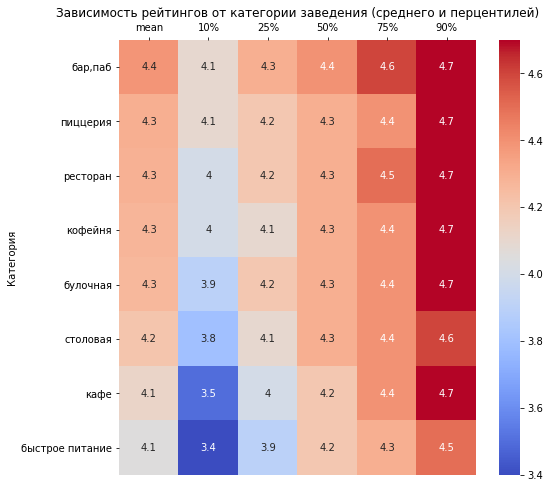

In [67]:
plt.figure(figsize=(8,8))
ax = sns.heatmap(rating[['mean', '10%', '25%', '50%', '75%', '90%']], cmap = 'coolwarm', annot = True)
plt.title("Зависимость рейтингов от категории заведения (среднего и перцентилей)", fontsize = 12)
ax.set(xlabel="", ylabel="Категория")
ax.tick_params(axis='y', labelrotation=0)
ax.xaxis.tick_top();

- медианные рейтинги у всех категорий заведений примерно одинаковые - от 4.2 до 4.4
- чаще всего низкие оценки получают заведения формата fast food и кафе - 10% заведений имеют рейтинги нижже 3.4 и 3.5, соответственно. При этом фастфуды и редко получают высокие оценки - 90% заведений имеют оценки не выше 4.5. Возможно, это связано с тем, что клиенты фастфудов ставят оценки чаще, если столкнулись с плохим сервисом/качеством и тд., а хорошие отзывы оставлют реже   
-  столовые и булочные также часто получают низкие оценки - 10% заведений из датасета оценено не выше 3.8 и 3.9 звезд, соответственно
- Выше всего клиенты оценивают заведения из категории бары, пабы - 80% заведений в этой категории имеют оценки от 4.1 до 4.7 с медианным значениями 4.4 
- Также хорошие оценки стабильно получают пиццерии , рестораны, кофейни - 80% всех оценок от 4.4.1 до 4.7 с медианным значением 4.3.

#### Средние рейтинги заведений по районам.
Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.
Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).
Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.


In [68]:
df = (
    data
    .pivot_table(index = 'district', values = 'rating', aggfunc = 'mean')
    .reset_index().sort_values(by = 'rating')
)

df.style.format({'rating':'{:.2f}'})

,district,rating
6,Юго-Восточный административный округ,4.10
3,Северо-Восточный административный округ,4.15
7,Юго-Западный административный округ,4.17
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
8,Южный административный округ,4.18
4,Северо-Западный административный округ,4.21
2,Северный административный округ,4.24
5,Центральный административный округ,4.38


In [69]:
moscow_loc = [55.751244, 37.618423]
m = Map(location = moscow_loc)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup = row['name'],
    ).add_to(marker_cluster)
    
data.apply(create_clusters, axis = 1)


m

In [70]:
moscow_loc = [55.751244, 37.618423]
m = Map(location = moscow_loc)


Choropleth (
    geo_data = '/datasets/admin_level_geomap.geojson',
    data = df,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    fill_Color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Средний рейтинг заведений по районам Москвы'    
).add_to(m)

m

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [71]:
top15_streets = data.groupby('street').agg(count = ('name','count')).reset_index().sort_values(by = 'count', ascending = False).head(15)
top15_streets

,street,count
1090,проспект Мира,183
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


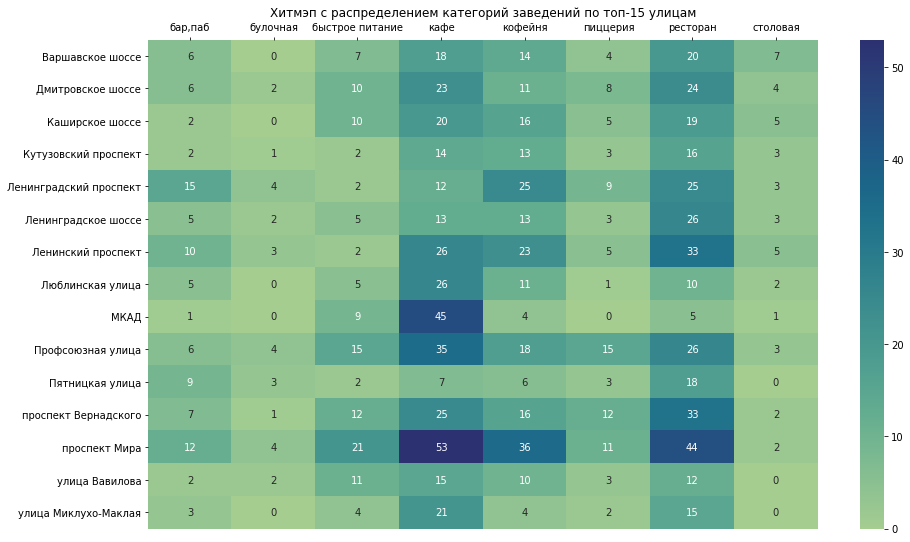

In [72]:
plt.figure(figsize = (15,9))
ax = sns.heatmap(
    data
    .query('street in @top15_streets.street.values')
    .pivot_table(index = 'street', columns = 'category', values = 'name', aggfunc = 'count')
    .fillna(0)
    
    , cmap = 'crest', annot=True
)
plt.title("Хитмэп с распределением категорий заведений по топ-15 улицам")
ax.set(xlabel="", ylabel="")
ax.xaxis.tick_top()
ax.xaxis.set_label_position("top");

In [73]:
df = data.query('street in @top15_streets.street.values').groupby(['street', 'category']).agg(count = ('name','count')).reset_index()

#сделаем сортировку в определенном порядке - от улицы с наибольшим кол-вом заведениий к наименьшему
my_dict = {top15_streets.street.values[i]: i for i in range(len(top15_streets.street.values))}
df = df.sort_values('street', key=lambda x: x.map(my_dict))

fig = px.bar(df, x="street", y="count", color="category",\
             title="количество заведений по категориям и районам",\
             labels = {'street':'улица', 'count': 'Количество заведений', 'category':'Категория'},\
             template="simple_white",\
             color_discrete_sequence=[ 'CadetBlue', 'lavender', 'CornflowerBlue', 'DarkCyan', 'DodgerBlue', 'LightBlue','Indigo', 'LightSeaGreen'])

fig.update_layout(xaxis = {"categoryorder":"total descending"}) 
             
fig.show()

- самое большое кол-во заведени1 - на пр-те Мира, в основном это кафе(53), рестораны(45) и кофейни (36), что соответствует общей пропорции по всей совокупности данных - около 70% заведений - это заведения их этих трех категорий
- много кафе (45) расположено на МКАДе, при этом заведений других категорий или мало, или вообше нет

####  Улицы, на которых находится только один объект общепита. 
Что можно сказать об этих заведениях?

In [74]:
street_w_one_object = data.street.value_counts()[(data.street.value_counts()) == 1]
print('Кол-во улиц, на которых находится один объект:', street_w_one_object.shape[0], '\n')
print(street_w_one_object)

Кол-во улиц, на которых находится один объект: 458 

Брянская улица                  1
улица Малая Полянка             1
Большой Сухаревский переулок    1
проспект Лихачёва               1
Пулковская улица                1
                               ..
4-й Воробьёвский проезд         1
Костромская улица               1
Боровское шоссе                 1
Парусный проезд                 1
Тучковская улица                1
Name: street, Length: 458, dtype: int64


In [75]:
df = data.query('street in @street_w_one_object.index')
df.describe(include='all')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,avg_bill_quant,street,is_24_7,district_short
count,458,458,458,458,458,458.000000,458.000000,458.000000,248,194,162.000000,24.000000,458.000000,154.000000,186.000000,458,458,458
unique,403,8,458,9,179,NaN,NaN,NaN,4,125,NaN,NaN,NaN,NaN,NaN,458,2,9
top,кафе,кафе,"Москва, улица Самеда Вургуна, 11",Центральный административный округ,"ежедневно, круглосуточно",NaN,NaN,NaN,средние,Средний счёт:1000–1500 ₽,NaN,NaN,NaN,NaN,NaN,улица Комдива Орлова,False,ЦАО
freq,19,160,1,145,31,NaN,NaN,NaN,157,10,NaN,NaN,NaN,NaN,NaN,1,427,145
mean,NaN,NaN,NaN,NaN,NaN,55.760131,37.617146,4.236681,NaN,NaN,975.802469,186.166667,0.290393,59.883117,873.913978,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,0.063903,0.093523,0.461952,NaN,NaN,1001.760084,55.544472,0.454440,48.110840,971.685308,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,55.578830,37.387459,1.000000,NaN,NaN,150.000000,95.000000,0.000000,0.000000,95.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,55.729272,37.561486,4.100000,NaN,NaN,331.250000,140.000000,0.000000,30.000000,271.250000,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,55.760801,37.612995,4.300000,NaN,NaN,650.000000,177.500000,0.000000,45.000000,525.000000,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,55.795678,37.667302,4.500000,NaN,NaN,1250.000000,213.750000,1.000000,80.000000,1250.000000,NaN,NaN,NaN


- Всего в таблице есть 458 улицы, на которых находится всего одно заведение
- чаще всего заведения относятся к категории кафе (160 заведений - почти 40%), находятся в ЦАО (145 заведений) и относятся к средней ценовой категории (157) и являются несетевыми (70% объектов)

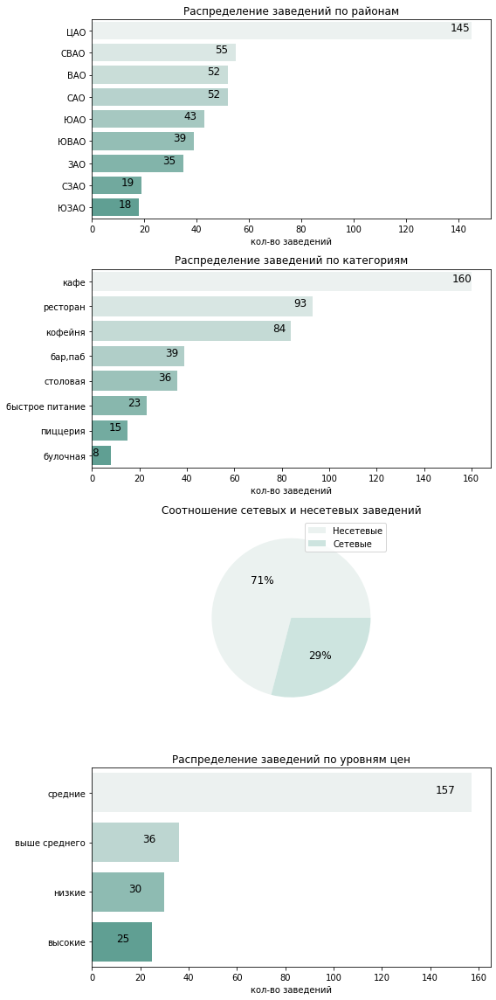

In [76]:
#добавим визуализацию
plt.subplots(4,1, figsize = (8,16), tight_layout=True)

# барплот с кол-вом заведений по районам
df1 = df.groupby('district_short').agg(count = ('name', 'count')).reset_index().sort_values(by = 'count', ascending = False)
ax1 = plt.subplot(4, 1, 1)
ax1 = sns.barplot(data = df1, x="count", y="district_short", palette = ("light:#5A9"))
ax1.set(xlabel = 'кол-во заведений', ylabel = '', title = 'Распределение заведений по районам')

for index, value in enumerate(df1.iloc[:,1]):# Добавление значений над столбцами
    ax1.text(value - 8, index , str(value), fontsize = 12)  # Размещение значения в столбце

# барплот с кол-вом заведений по категориям
df2 = df.groupby('category').agg(count = ('name', 'count')).reset_index().sort_values(by = 'count', ascending = False)
ax2 = plt.subplot(4, 1, 2)
ax2 = sns.barplot(data = df2, x="count", y="category", palette = ("light:#5A9"))
ax2.set(xlabel = 'кол-во заведений', ylabel = '', title = 'Распределение заведений по категориям')

for index, value in enumerate(df2.iloc[:,1]):# Добавление значений над столбцами
    ax2.text(value - 8, index , str(value), fontsize = 12)  # Размещение значения в столбце

    
# круговая диаграмма с соотношением круглосуточных и некруглосуточных кофеен   
ax3 = plt.subplot(4, 1, 3)
ax3 = plt.pie(df.chain.value_counts().values, autopct='%1.0f%%',\
          colors=sns.color_palette("light:#5A9"), textprops={'fontsize': 12});
plt.title("Cоотношение сетевых и несетевых заведений")
plt.legend(labels = ["Несетевые", "Сетевые"])


# барплот с кол-вом заведений по уровням цен
df4 = df.groupby('price').agg(count = ('name', 'count')).reset_index().sort_values(by = 'count', ascending = False)
ax4 = plt.subplot(4, 1, 4)
ax4 = sns.barplot(data = df4, x="count", y="price", palette = ("light:#5A9"))
ax4.set(xlabel = 'кол-во заведений', ylabel = '', title = 'Распределение заведений по уровням цен')

for index, value in enumerate(df4.iloc[:,1]):# Добавление значений над столбцами
    ax4.text(value - 15, index , str(value), fontsize = 12)  # Размещение значения в столбце


####  Средние чеки заведений по районам. 
Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. 

In [77]:
df = data.pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median').sort_values(by = 'middle_avg_bill', ascending = False).reset_index()
df

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,650.0
5,Восточный административный округ,600.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [78]:
m = Map(location = [55.751244, 37.618423])

Choropleth (
    geo_data = '/datasets/admin_level_geomap.geojson',
    data = df,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_Color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Медианный чек заведений по районам Москвы'    
).add_to(m)

m

Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [79]:
df = data.groupby('district')['avg_bill_quant'].describe().sort_values(by = 'mean', ascending = False)
df

,count,mean,std,min,25%,50%,75%,max
district,,,,,,,,
Центральный административный округ,1219.0,1054.940115,904.954090,60.0,350.00,850.0,1500.00,7000.0
Западный административный округ,354.0,936.706215,782.184798,60.0,325.00,650.0,1250.00,5250.0
Северный административный округ,397.0,756.637280,708.392001,60.0,250.00,500.0,1100.00,5000.0
Северо-Западный административный округ,180.0,737.888889,598.215212,60.0,273.75,500.0,1025.00,2900.0
Юго-Западный административный округ,266.0,722.571429,560.096491,95.0,300.00,517.5,1037.50,2750.0
Восточный административный округ,298.0,701.104027,627.682976,60.0,281.25,457.5,1000.00,5500.0
Южный административный округ,355.0,658.580282,541.399845,60.0,282.50,450.0,1000.00,3500.0
Северо-Восточный административный округ,358.0,629.469274,578.419035,60.0,270.50,425.0,818.75,4500.0
Юго-Восточный административный округ,222.0,592.409910,554.509770,60.0,250.00,387.5,750.00,3750.0


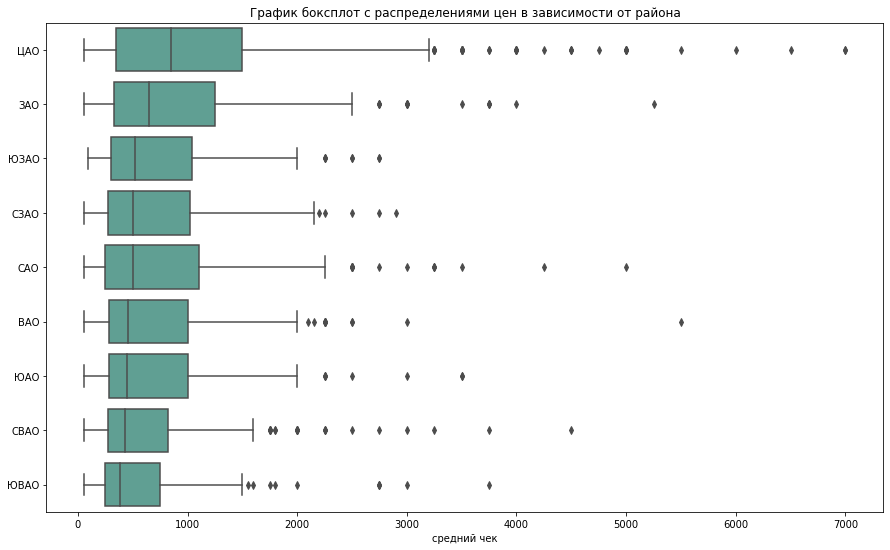

In [80]:
plt.figure(figsize = (15,9))
medians_sorted = data.groupby("district_short")["avg_bill_quant"].median().sort_values()[::-1].index
ax = sns.boxplot(data = data, x = 'avg_bill_quant',  y='district_short', color = '#5A9', order = medians_sorted)
plt.title('График боксплот с распределениями цен в зависимости от района')
ax.set(xlabel="средний чек", ylabel="");

- Самый большой разброс цен в ЦАО (с перекосом в сторону более высоких чеков), рестораны с самыми высокими ценами также находятся в ЦАО
- Второй по дороговизне - район ЗАО.
- Самые низкие цены - в ЮВАО и СВАО: в половине заведений можно уложиться в сумму до 1000 руб, редко можно встретить цены выше.

####  Выводы и рекомендации
По состоянию на лето 2022 года в Москве было 8406 заведений общественного питания. Данные взяты из открытых источников, с Яндекс Карт и Яндекс Бизнеса.

**ВЫВОДЫ**
- Больше всего заведений в категориях кафе (>2300), рестораны (2000) и  кофейни (1400) - суммарно почти 70% всех заведений. Меньше всего заведений из категорий булочная (250) и столовая (300) - в сумме около 7% от общего числа заведений из датасета.

- Медианные значения кол-ва посадочных мест у булочных, кафе, пиццерий и заведений быстрого питания - в диапазоне 50-65 мест. У столовых, кофеен, баров и рестранов медианные значения кол-ва мест лежат в диапазоне 80-90. Для всех категорий заведений характерен широкий диапазон интерквартильного размаха и большое количество выбросов.

- 62% всех заведений (5200) являются несетевыми, остальные 38% (3200) - сетевые. При этом среди заведений из категорий булочные, пиццерии и кофейни  сетевыми являются более половины всех заведений: 61%, 52% и 51%, соответсвенно. Среди самых многочисленных категорий (кафе и рестораны) на сетевые заведения приходится около 30-40%. А у баров и столовых сетевыми являются всего только 22% и 28% заведений, соответственно. 

- 15 крупнейших сетей: Шоколадница  - 120 заведений; далее Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix  - от 65 до 75 заведений; Кулинарная лавка братьев Караваевых, КОФЕПОРТ, Хинкальная, Prime - от 40 до 50 заведений; далее идут заведения поменьше (30-40 заведений в сети): Теремок, Чайхана, CofeFest, Буханка и Му-Му.

- Абсолютное большинство (почти четверть всех заведений) расположено в ЦАО - 2242. Меньше всего заведений в СЗАО (всего 409) - вероятно, потому, что в СЗАО бОльшая часть территории - это лесопарковая зона. Во всех остальных районах Москвы примерно одинаковое кол-во заведений - от 700 до 900.

- Медианные рейтинги у всех категорий заведений примерно одинаковые - от 4.2 до 4.4. При этом заведения формата fast food и кафе чаще остальных получают низкие оценки - 10% заведений имеют рейтинги нижже 3.4 и 3.5, соответственно. При этом фастфуды еще и редко получают высокие оценки - 90% заведений имеют оценки не выше 4.5. Возможно, это связано с тем, что клиенты фастфудов ставят оценки чаще, если столкнулись с плохим сервисом/качеством и тд., а хорошие отзывы оставлют реже. Выше всего клиенты оценивают заведения из категории бары, пабы - 80% заведений в этой категории имеют оценки от 4.1 до 4.7 с медианным значениями 4.4 . Возможно, это связано с тем, что бары имеют клиентоориентированный подход, и клиенты охотнее ставят высокие оценки. Также хорошие оценки стабильно получают пиццерии , рестораны, кофейни - 80% всех оценок от 4.4.1 до 4.7 с медианным значением 4.3.

- самое большое кол-во заведений - на пр-те Мира: в основном это кафе(53), рестораны(45) и кофейни (36), что соответствует соотношению категорий по всей совокупности данных - заведения их этих трех категорий составляют около 70% от всех заведений. Много кафе (45) расположено на МКАДе, при этом заведений других категорий на МКАДе или мало, или вообше нет.

- В таблице есть 458 улицы, на которых находится всего одно заведение. Чаще всего эти заведения относятся к категории кафе (160 заведений - почти 40%), находятся в ЦАО (145 заведений) и относятся к средней ценовой категории (155) и являются несетевыми (70% объектов)

- Самый дорогой район с самым большим разбросом цен  (с перекосом в сторону более высоких чеков) в ЦАО. Здесь находятся заведения с самыми высокими ценами в Москве. Самые низкие цены - в ЮВАО и СВАО: в половине заведений можно уложиться в сумму до 1000 руб, редко можно встретить цены выше.

**РЕКОМЕДАЦИИ**
- Как показало исследование, наиболее конкурентными являются категории кафе, ресторанов и кофеен. Раз рынок тут большой, значит, на этом рынке много клиентов и много денег, а значит можно попробовать открыть заведение в одной из этиъ категорий. Однако есть риск, что рынок перенасыщен,тогда создать конкурентное преимущество будет сложно. С другой стороны, можно воспользоваться противоположной стратегией - открыть булочную или столовую, которых в Москве относительно мало, и попробовать построить бизнес в менее конкурентной среде, однако при такой стратегии также высока вероятность неуспеха - в случае, если отсутствие большого кол-ва заведений в этих категориях связано с невысоким спросом.
- Учесть, что булочные и кофейни часто являются сетевыми (>50% заведений),  а с сетевыми заведениями конкурировать может быть сложно.
- Аналогично 2 противоположные стратегии можно рассматривать и в вопросе расположения точки - либо выбирать конкурентный район ЦАО, либо остановиться на СЗАО, в котором рынок общепита имеет меньшее покрытие в сравнении с остальными районами Москвы. Если смотреть детальнее на вопрос расположения: можно выбрать либо место для заведения на одной из улиц на топ15, либо открыть заведение на одной из 458 улиц, где есть всего одно заведение общепита, тем самым создав выбор для потенциальных клиентов.
- В целом, рейтинг заведений у заведений Москвы достаточно высокий, так что сервис и качество рекомендуется организовывать на хорошем уровне. В частности, если рассматривать открытие кафе или фастфуда - высокое качество может стать конкурентным преимуществом.


### Детализируем исследование: открытие кофейни
*Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.*

Ответьте на следующие вопросы:
Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [81]:
# сделаем срез таблицы с одними кофейнями
data_cof = data.query('category == "кофейня"')

In [82]:
# визуализируем расположение кофеен на карте
# создаём карту Москвы
m = Map(location=[55.751244, 37.618423], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_cof.apply(create_clusters, axis=1)

# выводим карту
m

In [83]:
print('всего кофеен в датасете:', data_cof.name.count())

всего кофеен в датасете: 1413


In [84]:
data_cof.groupby('district').address.count().sort_values(ascending = False)

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: address, dtype: int64

Есть ли круглосуточные кофейни?

In [85]:
print('всего круглосуточных кофеен:', data_cof['is_24_7'].sum())

всего круглосуточных кофеен: 59


Какие у кофеен рейтинги? Как они распределяются по районам?

In [86]:
print('Средний рейтинг по всем кофейням из датасета:', round(data_cof.rating.mean(),2))

Средний рейтинг по всем кофейням из датасета: 4.28


In [87]:
data_cof.groupby('district').agg({'rating':'mean'}).sort_values(by = 'rating', ascending = False).style.format('{:.2f}')

,rating
district,
Центральный административный округ,4.34
Северо-Западный административный округ,4.33
Северный административный округ,4.29
Юго-Западный административный округ,4.28
Восточный административный округ,4.28
Южный административный округ,4.23
Юго-Восточный административный округ,4.23
Северо-Восточный административный округ,4.22
Западный административный округ,4.20


- Всего кофеен 1413, из них больше всего - в ЦАО (428), меньше всего - в СЗАО (62). 
- 59 кофеен - круглосуточные 
- средний рейтинг - 4.28. Самый высокий рейтинг у заведений в ЦАО и СЗАО - 4.34 и 4.33. Самый низкий рейтинг - в ЗАО (4.20). 


Визуализируем выводы и добавим гистограмму с распределением цен на стакан кофе

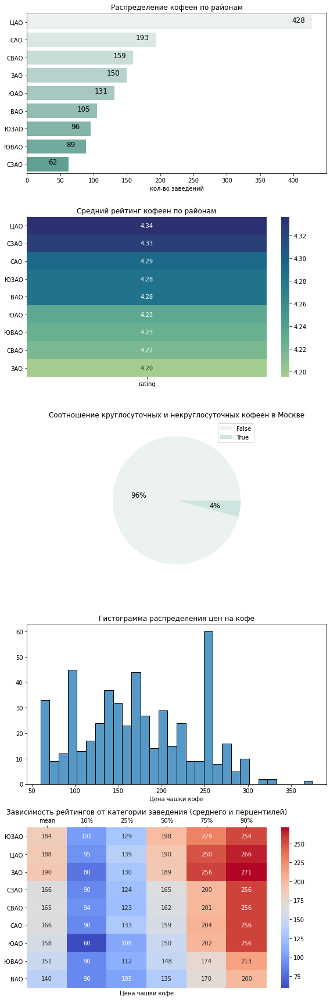

In [88]:
plt.subplots(5,1, figsize = (8,24), tight_layout=True)

# барплот с кол-вом заведений по районам
df = data_cof.groupby('district_short').agg(count = ('name', 'count')).reset_index().sort_values(by = 'count', ascending = False)
ax1 = plt.subplot(5, 1, 1)
ax1 = sns.barplot(data = df, x="count", y="district_short", palette = ("light:#5A9"))
ax1.set(xlabel = 'кол-во заведений', ylabel = '', title = 'Распределение кофеен по районам')

for index, value in enumerate(df.iloc[:,1]):# Добавление значений над столбцами
    ax1.text(value - 30, index , str(value), fontsize = 12)  # Размещение значения в столбце

#хитмэп со средними рейтингами кофеен по районам    
df = data_cof.pivot_table(index = 'district_short', values = 'rating', aggfunc = 'mean').sort_values(by = 'rating', ascending = False)
ax2 = plt.subplot(5, 1, 2)
ax2 = sns.heatmap(df, cmap = 'crest', annot=True, fmt ='.2f') 
ax2.set(xlabel = '', ylabel = '', title = 'Средний рейтинг кофеен по районам')
ax2.tick_params(axis='y', labelrotation=0)

# круговая диаграмма с соотношением круглосуточных и некруглосуточных кофеен
ax3 = plt.subplot(5, 1, 3)
ax3 = plt.pie(data_cof.is_24_7.value_counts().values, autopct='%1.0f%%',\
          colors=sns.color_palette("light:#5A9"), textprops={'fontsize': 12});
plt.title("Cоотношение круглосуточных и некруглосуточных кофеен в Москве")
plt.legend(labels = data_cof.is_24_7.value_counts().index)

#гистограмма со средними цеными за чашку кофе  
ax4 = plt.subplot(5, 1, 4)
ax4 = sns.histplot(data_cof.middle_coffee_cup, bins = 30)
ax4.set(xlabel = 'Цена чашки кофе', ylabel = '', title = 'Гистограмма распределения цен на кофе')

#Хитмэп с распределением цен на кофе по районам 
price = data_cof.groupby('district_short').middle_coffee_cup.describe(percentiles = [.1, .25, .5, .75, .9]).sort_values(by = '50%', ascending = False)

ax5 = plt.subplot(5, 1, 5)
ax5 = sns.heatmap(price[['mean', '10%', '25%', '50%', '75%', '90%']], cmap = 'coolwarm', annot = True, fmt = '.0f')
#ax.set(xlabel="", ylabel="Категория")
#ax.tick_params(axis='y', labelrotation=0)
ax5.xaxis.tick_top();
ax5.set(xlabel = 'Цена чашки кофе', ylabel = '', title = "Зависимость рейтингов от категории заведения (среднего и перцентилей)");


**Рекомендации по открытию кофейни**
- самая высокая конкуренция среди кофеен - в ЦАО: их здесь больше всего - 428 (почти треть всех кофеен города) и средний рейтинг самый высокий - 4.34. Медианное значение средней цены высокое (но не самое высокое - в ЮЗАО цены на кофе выше), но при этом диапазон цен широкий - можно найти кофе на любой кошелек. Кажется, что в ЦАО открыть успешное кафе будет достаточно сложно.
- если смотреть на средние рейтинги кофеен по районам, то видно, что меньше всего качественных кофеен в ЗАО (средний рейтинг 4.2), при этом цены достаточно высокие - на уровне ЦАО, хотя диапазон цен также достаточно широкий. Соответственно, потенциально привлекательно выглядит идея открытия кафе в ЗАО с акцентом на качество заведения - высокий рейтинг будет являтся конкурентным преимуществом. Рекомендуем установить цены ниже 190 руб/чашку - это создаст дополнительное конкурентное преимущество ( у 50% заведений в ЗАО цена за чашу выше)

### Презентация
Подготовьте презентацию исследования для инвесторов. Отвечая на вопросы о московском общепите, вы уже построили много диаграмм, и помещать каждую из них в презентацию не нужно. Выберите важные тезисы и наблюдения, которые могут заинтересовать заказчиков. 
Для создания презентации используйте любой удобный инструмент, но отправить презентацию нужно обязательно в формате PDF. Приложите ссылку на презентацию в markdown-ячейке в формате:
Презентация: <ссылка на облачное хранилище с презентацией> 
Следуйте принципам оформления из темы «Подготовка презентации».

 Презентация:
https://github.com/savitskaya-om/YaPracticum/blob/main/Restaurants_analysis_Savitsakaya%20Olga.pdf